# What is Singular Value Thresholding (SVT)?

Published: November 28, 2019

Download: This Jupyter notebook is at our GitHub repository. If you want to evaluate the code, please download the notebook from the repository of [**tensor-learning**](https://github.com/xinychen/tensor-learning).

## 1 Matrix Completion & SVT

In [20]:
import numpy as np

def svt(mat, tau):
    u, s, v = np.linalg.svd(mat, full_matrices = 0)
    vec = s - tau
    vec[vec < 0] = 0
    return np.matmul(np.matmul(u, np.diag(vec)), v)

def LRMC(sparse_mat, dense_mat, rho, maxiter):
    
    pos_train = np.where(sparse_mat != 0)
    pos_test = np.where((sparse_mat == 0) & (dense_mat != 0))
    binary_mat = sparse_mat.copy()
    binary_mat[pos_train] = 1
    
    X = sparse_mat.copy()
    Z = np.zeros(sparse_mat.shape)
    T = np.zeros(sparse_mat.shape)
    rse = np.zeros(maxiter)
    x = 0
    
    for it in range(maxiter):
        Z = svt(X + T / rho, 1 / rho)
        X = Z - T / rho
        X[pos_train] = sparse_mat[pos_train]
        T = T - rho * (Z - X)
        x = np.append(x, X[-1, -1])
        fig = plt.figure(figsize=(6, 3))
        plt.plot(x)
        plt.show()
#         rho = rho * (it + 1) / (it + 1.5)
        rse[it] = (np.linalg.norm(X[pos_test] - dense_mat[pos_test], 2) 
                   / np.linalg.norm(dense_mat[pos_test], 2))
    return X, rse

In [2]:
import imageio

name0 = ["lena"]
name = ["lena_mar"]
image = imageio.imread('../datasets/color-images/{}.bmp'.format(name0[0]))
sparse_image = imageio.imread('../datasets/color-images/{}.bmp'.format(name[0]))
sparse_mat = sparse_image[:, :, 1]
dense_mat = image[:, :, 1]

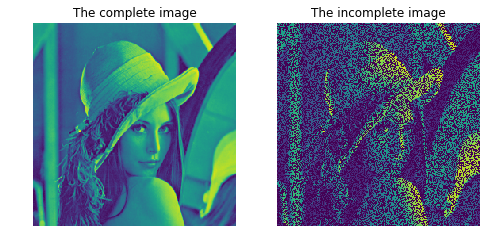

In [4]:
import matplotlib.pyplot as plt

plt.subplots(1, 2, figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.imshow(dense_mat)
plt.title('The complete image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(sparse_mat)
plt.title('The incomplete image')
plt.axis('off')
plt.show()

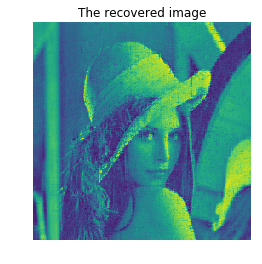

Running time: 0 seconds.

Relative Squared Error (RSE) is 0.152632.


In [26]:
import time

start = time.time()
rho = 0.005
maxiter = 50
mat_hat, rse_svt = LRMC(sparse_mat, dense_mat, rho, maxiter)
end = time.time()

plt.imshow(mat_hat)
plt.title('The recovered image')
plt.axis('off')
plt.show()

print('Running time: %d seconds.'%(end - start))
print()
print('Relative Squared Error (RSE) is {:.6}.'.format(rse_svt[-1]))

Text(0.5, 1.0, 'Matrix completion using SVT.')

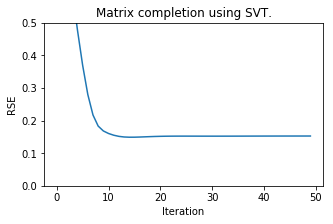

In [27]:
fig = plt.figure(figsize=(5, 3))
ax = plt.subplot(111)
plt.plot(rse_svt)
ax.set_ylim([0, 0.5])
plt.xlabel("Iteration")
plt.ylabel("RSE")
plt.title("Matrix completion using SVT.")

Text(0.5, 1.0, 'Matrix completion using SVT.')

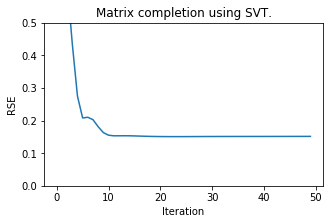

In [18]:
fig = plt.figure(figsize=(5, 3))
ax = plt.subplot(111)
plt.plot(rse_svt)
ax.set_ylim([0, 0.5])
plt.xlabel("Iteration")
plt.ylabel("RSE")
plt.title("Matrix completion using SVT.")

## 2 Matrix Completion & Fast SVT

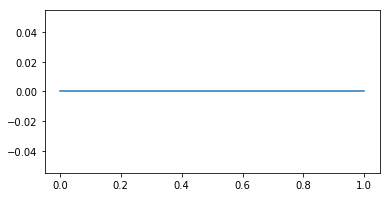

/Users/xinyuchen/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in double_scalars


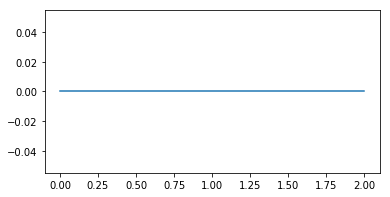

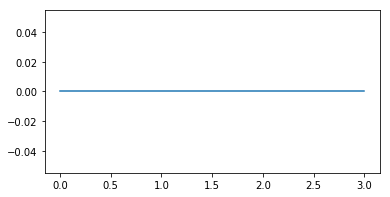

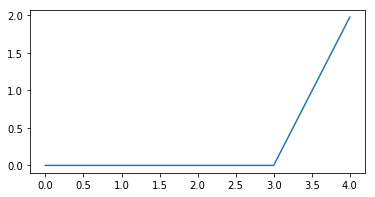

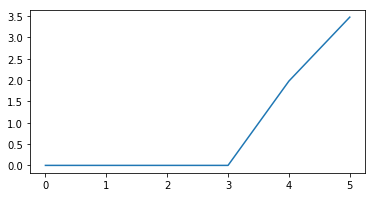

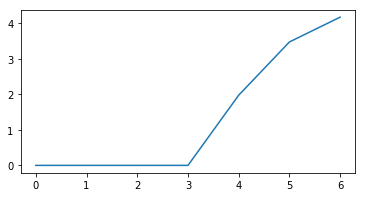

...

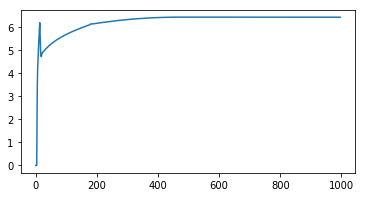

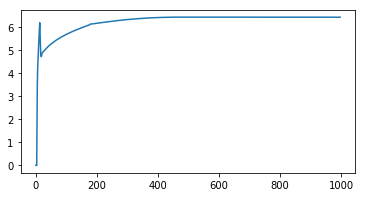

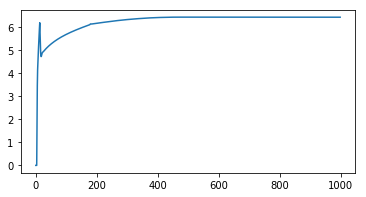

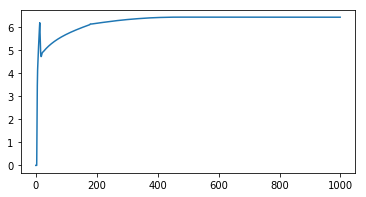

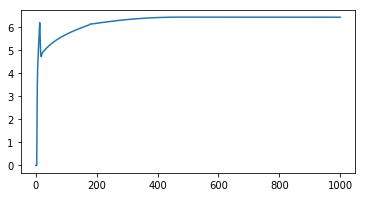

[[1.         2.         3.         4.        ]
 [2.         3.         4.         5.        ]
 [3.         4.         5.         6.        ]
 [4.         5.         6.         6.9637867 ]
 [5.         6.         5.87867211 6.44540401]]


In [28]:
import numpy as np
mat = np.array([[1, 2, 3, 4], 
                [2, 3, 4, 5],
                [3, 4, 5, 6], 
                [4, 5, 6, 7], 
                [5, 6, 7, 0]])
mat[-1, -2] = 0
mat[-2, -1] = 0
rho = 0.02
mat_hat, rse = LRMC(mat, mat, rho, 1000)
print(mat_hat)

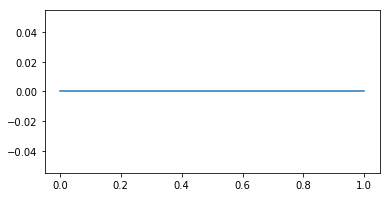

/Users/xinyuchen/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in double_scalars


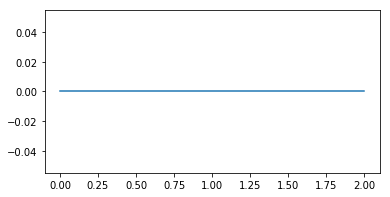

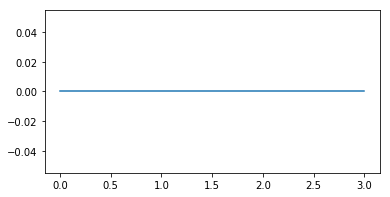

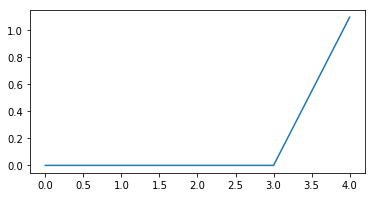

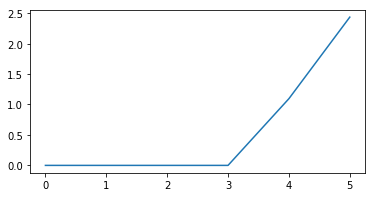

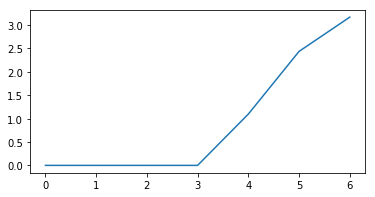

...

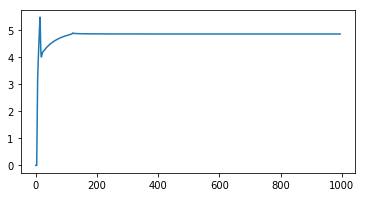

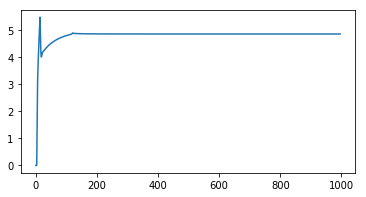

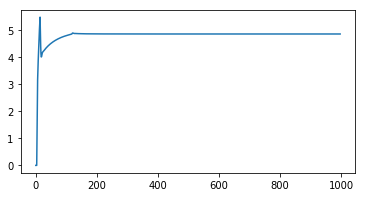

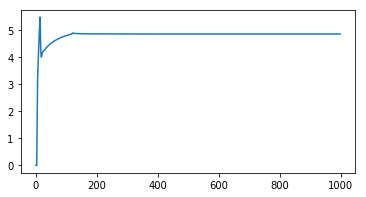

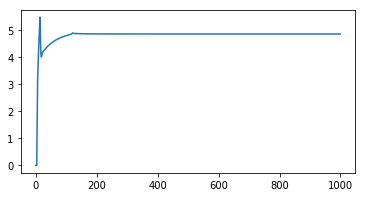

[[1.         2.         3.         4.         5.         6.        ]
 [2.         3.         4.         5.         6.         5.24366438]
 [3.         4.         5.         6.         6.61146923 4.84712906]]


In [30]:
import numpy as np
mat = np.array([[1, 2, 3, 4, 5], 
                [2, 3, 4, 5, 6],
                [3, 4, 5, 6, 7], 
                [4, 5, 6, 7, 0]])
mat = np.array([[1, 2, 3, 4, 5, 6], 
                [2, 3, 4, 5, 6, 7],
                [3, 4, 5, 6, 7, 0]])
mat[-1, -2] = 0
mat[-2, -1] = 0
rho = 0.02
mat_hat, rse = LRMC(mat, mat, rho, 1000)
print(mat_hat)